# How Noah grew up!

[Noah Kalina](http://www.noahkalina.com/) took a photo of himself, every day for 20 years, and put them all in a video on youtube! I got fascinated by his work and dedication to this project, and was equally captivated by the amazing sound that accompanies the video.

So, before we start having some fun with the images in the video, don't miss out on watching the video and enjoying the amazing soundtrack from [Carly Comando](http://www.carlycomandomusic.com/). I can highly recommend the song "Everyday" and "Circadian".

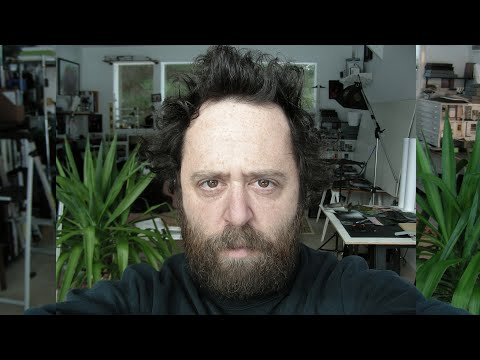

In [1]:
from IPython.lib.display import YouTubeVideo
YouTubeVideo('wAIZ36GI4p8')

Now, that you know what the video is about, let's quickly discuss what this notebook intends to do!

---

The **goal of this notebook** is to:
1. Take the pictures in the video, stablize (e.g. rotation, translation and zooming) of the images os that the eyes are always at the same location and orientation.
2. Explore the preprocessed data.
3. Average the images "through time", using a rolling windows averaging approach. This will improve the signal-to-noise ratio, i.e. it will blure out quickly changing things like background, hair styles, clothing items, etc. and only focus on the general changes in noah's face.
4. Have fun with some machine learning and see "what Noah you are", by generating an artificial "Noah image" based on a given input image.

So, let's start!

## Step 1: Data Acquisition

First things first, let's collect all photos from the video with `pytube`. If the package is not yet installed on your machine you can do so with `pip install pytube`.

In [2]:
# Let's install pytube and a few other python packages
!pip install -qU pytube opencv-python tqdm ipywidgets

### A. Download the video

In [3]:
from pytube import YouTube

In [4]:
# Download video
video_url = 'https://www.youtube.com/watch?v=wAIZ36GI4p8'
out_folder = 'video'
filename = 'noah'
yt_streams = YouTube(video_url).streams.filter(progressive=True, type='video', res='360p')
yt_streams.first().download(out_folder, filename)

'/Users/mnotter/Documents/github/noah_ages/video/noah.mp4'

### B. Extract all individual images

*First*, we will use the package OpenCV to load all images from the video. *Second*, we will go through all the images and only keep unique images.

In [5]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import patches

from tqdm.notebook import tqdm

In [6]:
# Load video with OpenCV and extract relevant parameters
video = cv2.VideoCapture(os.path.join(out_folder, filename+'.mp4'))
video_frame_count = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
print('Video has %d number of frames.' % video_frame_count)

Video has 11937 number of frames.


In [7]:
video_frame_count

11937

In [8]:
# Stack to keep unique images
imgs = []

# Looping through all images, and only adding them to the stack if they are new
for idx in tqdm(np.arange(video_frame_count)):

    # Read frame
    video.set(cv2.CAP_PROP_POS_FRAMES, idx)
    frame_retrieved, frame = video.read()
    
    # Check if image is new by correlating it to previous frame
    if frame_retrieved:
        if len(imgs)>0 and np.corrcoef(frame.ravel(), imgs[-1].ravel())[0, 1]>0.99:
            continue
        imgs.append(frame)

# Transform stack into numpy array and switch colorcode from BGR to RGB
imgs = np.array(imgs)[..., ::-1]

print('Dataset has shape of', imgs.shape)

  0%|          | 0/11937 [00:00<?, ?it/s]

Dataset has shape of (7262, 360, 480, 3)


Let's take a look at a few images.

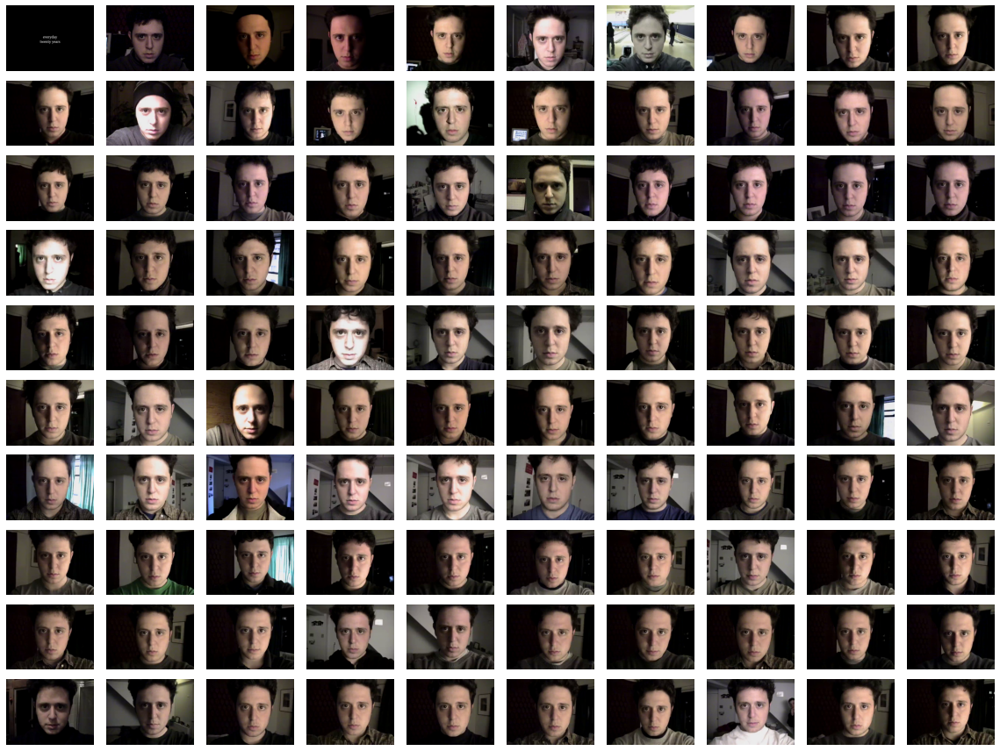

In [9]:
# Plot a grid of certain size of first x images
size = 10
fig, axes = plt.subplots(size, size, figsize=(16, 12))
for i, ax in zip(np.arange(size**2), axes.flatten()):
    ax.imshow(imgs[i])
    ax.axis('off')
plt.tight_layout();

**Observation**: What we can see is (1) that the first image is not a picture of Noah and (2) that some images have different color contrast due to light condition.

**Decision**: *First*, images without faces need to be removed and *second* light conditions need to be addressed.

## Step 2. Data preparation

### A. Detection of faces

We will use OpenCV to detect faces in the images. This can be done with the following helper functions.

In [10]:
import cv2

# Creating face_cascade and eye_cascade objects
face_cascade=cv2.CascadeClassifier("haarcascade_frontalface_default.xml")
eye_cascade=cv2.CascadeClassifier("haarcascade_eye.xml")

In [11]:
def detect_face(img, min_dist=10):

    """Function that looks for faces and returns the location of them."""
    
    # Convert image into grayscale color
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Create face variable
    faces = face_cascade.detectMultiScale(gray, 1.1, min_dist)
    
    # Only return faces of a minimum size
    faces_min_size = faces[np.all(faces[:, 2:]>150, axis=1)]
    
    return faces_min_size

Let's test this function on a face with an image.

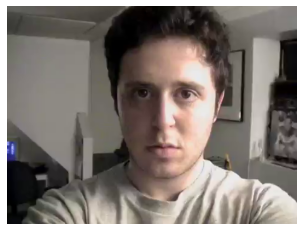

In [12]:
# Select one image and show it
img = imgs[200]
plt.imshow(img)
plt.axis('off');

In [13]:
# Let's collect faces and keep the first one
face_coord = detect_face(img)[0]
face_coord

array([156,  65, 212, 212], dtype=int32)

So how good is this face detection?

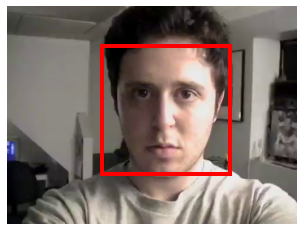

In [14]:
plt.imshow(img)
plt.axis('off');
plt.gca().add_patch(patches.Rectangle(
    face_coord[:2], face_coord[2], face_coord[3],
    linewidth=4, edgecolor='r', facecolor='none'))
plt.show()

Perfect! And what about the first image without a face?

No face detect in the following image...


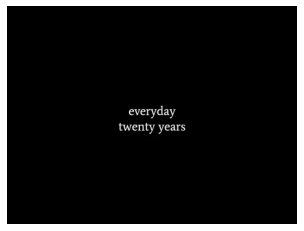

In [15]:
# Select first image
img = imgs[0]

# Extract face coordination
try:
    face_coord = detect_face(img)
except:
    print('No face detect in the following image...')
    plt.imshow(img)
    plt.axis('off')

As we can see, no face was detected. Good! We can use that to keep only those images that actually contain faces.

### B. Contrast correction

The other thing we wanted to look at was the correction of contrast and light conditions. So let's look at a few images.

In [16]:
# Image indeces to look at
idx = [1, 2, 3, 4, 5, 6, 11]

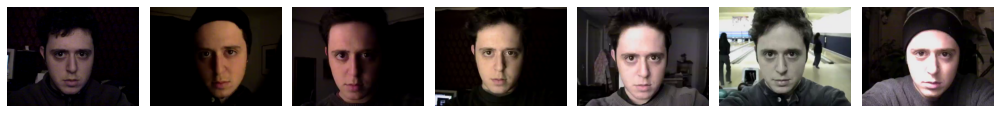

In [17]:
# Plot the selected images next to each other
fig, axes = plt.subplots(1, len(idx), sharey=True, figsize=(2*len(idx), 2.5))
for i, j in enumerate(idx):
    axes[i].imshow(imgs[j])
    axes[i].axis('off')
plt.tight_layout()

So how do we correct for image contrast? The best way is to do this manually, for each image individually. And as an automated alternative we could try something that is called contrast stretching. We will be using `scikit-image` for this, so make sure that it's installed (`pip install scikit-image`).

In [18]:
from skimage.exposure import rescale_intensity

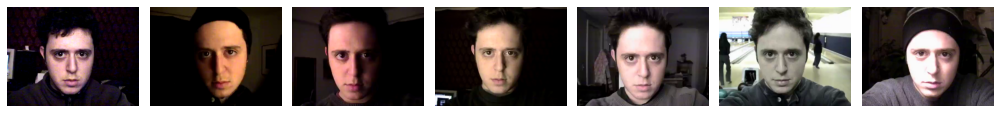

In [19]:
# Let's see the effect of contrast stretching
fig, axes = plt.subplots(1, len(idx), sharey=True, figsize=(2*len(idx), 2.5))
for i, j in enumerate(idx):
    plow, phigh = np.percentile(imgs[j], (0, 99))
    img_rescale = rescale_intensity(imgs[j], in_range=(plow, phigh))
    axes[i].imshow(img_rescale)
    axes[i].axis('off')
plt.tight_layout()

It seems to work for the darker images but not for the brighter ones. Even if it's not perfect, let's go ahead with this.

In [20]:
# Rescale image intensity for all images
imgs_intensity = []

for img in tqdm(imgs):
    plow, phigh = np.percentile(img, (0, 99))
    imgs_intensity.append(rescale_intensity(img, in_range=(plow, phigh)))
imgs_intensity = np.array(imgs_intensity)

  0%|          | 0/7262 [00:00<?, ?it/s]

Once more, let's look at the big picture.

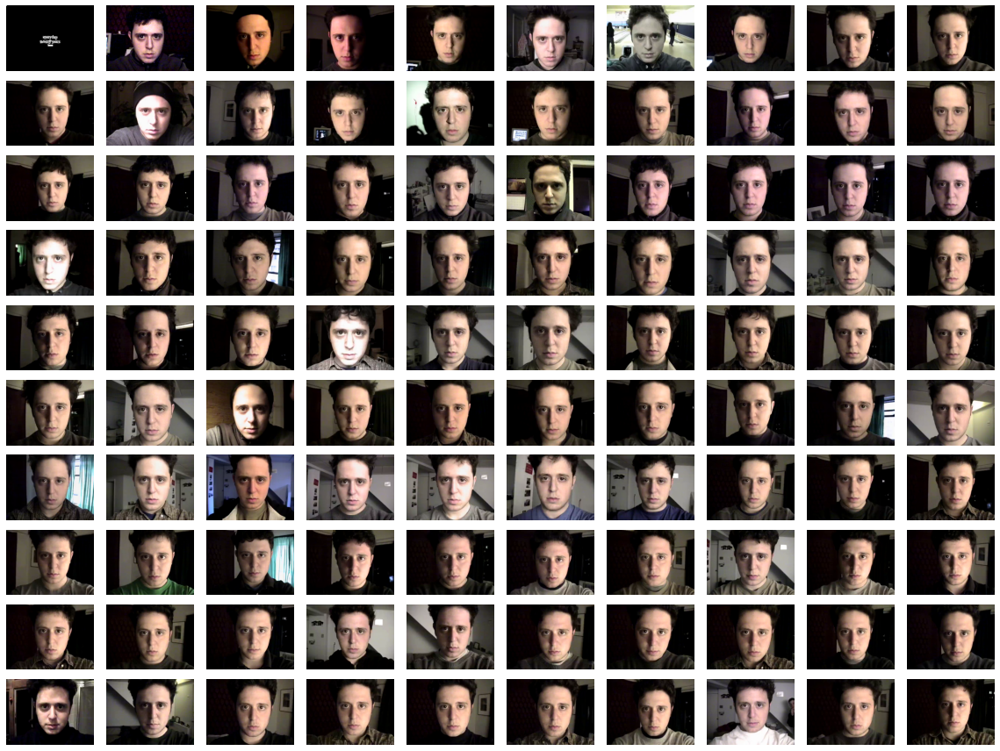

In [21]:
# Plot a grid of certain size of first x images
size = 10
fig, axes = plt.subplots(size, size, figsize=(16, 12))
for i, ax in zip(np.arange(size**2), axes.flatten()):
    ax.imshow(imgs_intensity[i])
    ax.axis('off')
plt.tight_layout();

Now that we've prepared our data. Let's take a look at the "average Noah".

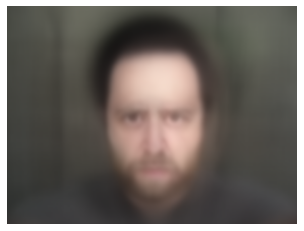

In [22]:
# Compute the mean image and plot it
noah_mean = np.mean(imgs_intensity, axis=0).astype('int')
plt.imshow(noah_mean)
plt.axis('off');

Hmm... that looks fuzzy. The reason for this becomes clearer if we look at a few images in quick succession.

In [23]:
# Save first few images in a gif and show it
from IPython.display import Image
from imageio import mimwrite
mimwrite('noah_01.gif', imgs_intensity[1:121], format='gif', fps=12)
Image(url='noah_01.gif', width=400)

**Observation**: Images are not centered equally.

**Decision**: Images need to be centered to the same reference point. Ideally with respect to the eyes.

### C. Recentering images with respect to center of eye

Let's see if we can detect the eyes in an image and then trinagulate the center between them. To do this, let's go back to the previous example.

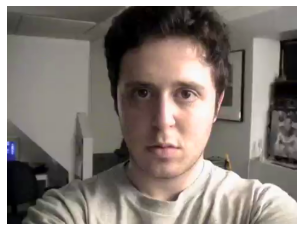

In [24]:
# Select one image and show it
img = imgs_intensity[200]
plt.imshow(img)
plt.axis('off');

To improve the detection of the eyes, as before, let's first detect the face.

In [25]:
# Collect information about the face
face_coord = detect_face(img)[0]
face_coord

array([156,  65, 212, 212], dtype=int32)

Now, let's write a helper function to detect the eyes.

In [26]:
def extract_eye_location(face_coord, img):

    # Extract face coordinates
    (x , y,  w,  h) = face_coord

    # Simplify image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Create regions of interests
    roi = gray[y:(y+h), x:(x+w)]

    # Create eye variables
    eyes = eye_cascade.detectMultiScale(roi, 1.1, 4)
    
    # Detect eyes with closest y value (nose might also be detected as eye and should be excluded)
    eyes_idx = np.argsort(np.abs(eyes[:, 1] - np.mean(eyes[:, 1])))[:2]
    
    # Get first and second eye
    eye_1, eye_2 = eyes[eyes_idx]

    # Correct eye laterality
    if eye_1[0] < eye_2[0]:
        left_eye = eye_1
        right_eye = eye_2
    else:
        left_eye = eye_2
        right_eye = eye_1

    # Calculating coordinates of a central points of the rectangles
    left_eye_center = (int(left_eye[0] + (left_eye[2] / 2)), int(left_eye[1] + (left_eye[3] / 2)))
    right_eye_center = (int(right_eye[0] + (right_eye[2]/2)), int(right_eye[1] + (right_eye[3]/2)))
    
    return left_eye_center, right_eye_center

Let's give it a spin and see how well it does.

In [27]:
# Extract location of left and right eye
eye_left, eye_right = extract_eye_location(face_coord, img)
eye_left, eye_right

((66, 79), (138, 81))

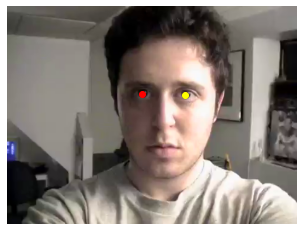

In [28]:
# Plot image with eyes
plt.imshow(img)
plt.scatter(*(face_coord[:2] + eye_left), c='red')
plt.scatter(*(face_coord[:2] + eye_right), c='yellow')
plt.axis('off');

Perfect, and what about the center between the eyes?

In [29]:
# Compute center between the eyes
eye_center = np.sum((eye_left, eye_right), axis=0)/2

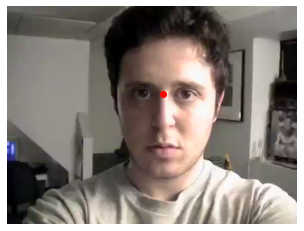

In [30]:
# Plot image with eyes
plt.imshow(img)
plt.scatter(*(face_coord[:2] + eye_center), c='red')
plt.axis('off');

Now, to do the next step we need some linear algebra to allow for translation, rotation and scaling of the image.

In other words, we need a transformation matrix that specifies what kind of linear transformation we want to apply to the image. To do this, let's write a new function.

In [31]:
def get_affine_matrix(x_off=0, y_off=0, scale=1, angle=0):

    # Translation
    T_pos = np.array([
        [1, 0, x_off],
        [0, 1, y_off],
        [0, 0, 1]])

    # Rotation
    T_rotate = np.array([
        [np.cos(angle), np.sin(angle), 0],
        [-np.sin(angle), np.cos(angle), 0],
        [0, 0, 1]])

    # Scale
    T_scale = np.array([
        [scale, 0, 0],
        [0, scale, 0],
        [0, 0, 1]])
    
    # Combine everything
    T = T_pos @ T_rotate @ T_scale
    
    # Transform into CV2 format
    T_opencv = np.float32(T.flatten()[:6].reshape(2,3))

    return T_opencv

Now that we have this in place, let's write a function that takes the image as an input, puts it on a black canvas and recenters it in such a way that the center between the eyes is in the center of the image. To do this we will combine the different functions we wrote above.

In [32]:
def recenter_image(img, canvas_dim=[640, 480]):

    # Get center of image
    new_center = np.divide(canvas_dim, 2).astype('int')

    # Get location of face
    face_coord = detect_face(img)[0]

    # Get location of eyes
    eye_left, eye_right = extract_eye_location(face_coord, img)

    # Compute center between the eyes
    eye_center = np.sum((eye_left + face_coord[:2],
                         eye_right + face_coord[:2]), 
                        axis=0)/2
    
    # Compute missing offset
    x_off, y_off = new_center - eye_center
    
    # Establish translation matrix
    M = get_affine_matrix(x_off, y_off, 1, 0)

    # Apply transformation
    img_centered = cv2.warpAffine(img, M, tuple(canvas_dim))

    return img_centered

Let's see the function in action.

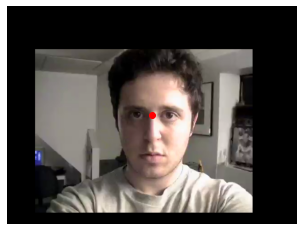

In [33]:
# Plot recentered image
plt.imshow(recenter_image(img, canvas_dim=[640, 480]))
plt.scatter(320, 240, c='red')
plt.axis('off');

Perfect. So what's the outcome if we apply this to all images?

0it [00:00, ?it/s]

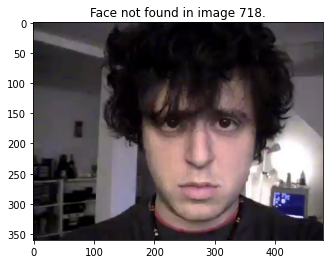

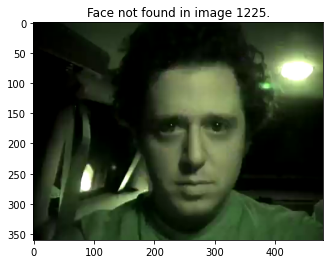

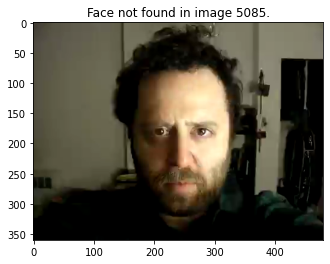

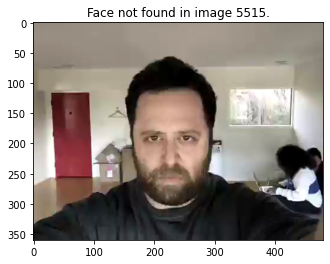

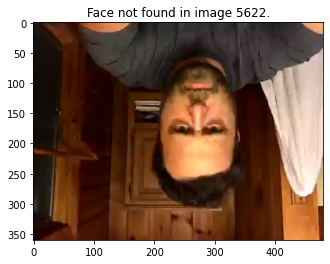

...

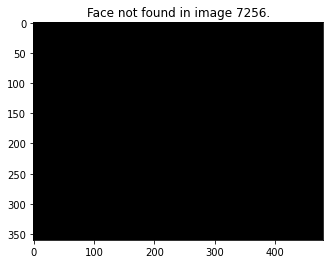

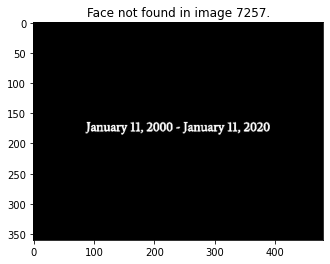

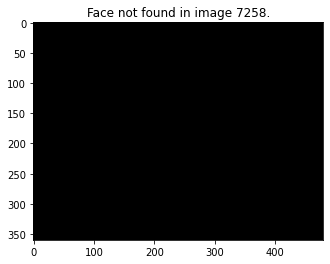

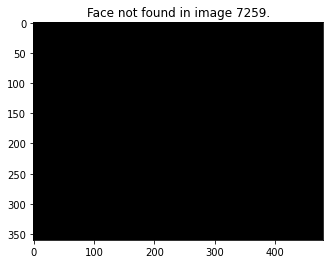

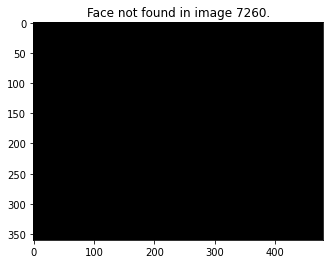

In [34]:
# Loop through all the images and recenter them if eye center can be found
imgs_centered = []
for i, img in tqdm(enumerate(imgs_intensity[1:])):
    try:
        img_centered = recenter_image(img)
        imgs_centered.append(img_centered)
    except:
        plt.imshow(img)
        plt.title('Face not found in image %d.' % i)
        plt.show()
imgs_centered = np.array(imgs_centered)

Given that we have a lot of images to work with, let's ignore that in these few images the face cannot be detected for some reasons.

So, what does the "average Noah" look like now?

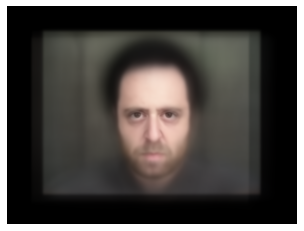

In [35]:
# Compute the mean image and plot it
noah_mean = np.mean(imgs_centered, axis=0).astype('int')
plt.imshow(noah_mean)
plt.axis('off');

Much better! What about a short gif of the first few images?

In [36]:
# Save first few images in a gif and show it
from IPython.display import Image
from imageio import mimwrite
mimwrite('noah_02.gif', imgs_centered[:120], format='gif', fps=12)
Image(url='noah_02.gif', width=400)

Interesting! There seem to be three issues here:
- **Frist**, some images seem to have been moved too much, their `eye_center` is compeletely off.
    - **Solution**: For now let's leave this on the side, we will come back to this.
- **Second**, Noah's face is not equally close to the camera in all images. In other words, the distance between the eyes is not constant.
    - **Solution**: We need to enforce that the distance between the eyes is of a constant length.
- **Third**, and this one is more difficult to detect here, but some images are slightly rotated.
    - **Solution**: The images need to be rotated, so that Noah's eyes lie on a horizontal line.
    
Now that we know what needs to be done, let's go ahead with solving these issues.

### D. Rescaling and rotating images with respect to eye features

Rescaling the images to a constant distance between the eyes and rotating the images to ensure that the eyes are on a horizontal level can be done rather quickly, if we know the location of both eyes. So as before, let's get these information once more.

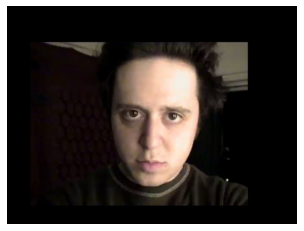

In [37]:
# Select one image and show it
img = imgs_centered[401]
plt.imshow(img)
plt.axis('off');

First, let's again collect the location of the left and right eye.

In [38]:
# Collect location of left and right eye
face_coord = detect_face(img)[0]
eye_left, eye_right = extract_eye_location(face_coord, img)

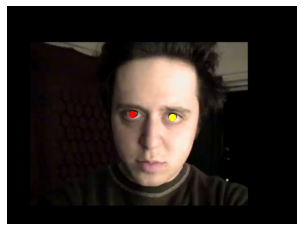

In [39]:
# Plot image with eyes
plt.imshow(img)
plt.scatter(*(face_coord[:2] + eye_left), c='red')
plt.scatter(*(face_coord[:2] + eye_right), c='yellow')
plt.axis('off');

Now that we have this information, let's write a function that can give us information about the angle between the eyes (with respect to a horizontal line), and the scale that needs to be applied to get a constant eye distance of 100 pixels.

In [40]:
def get_angle_and_scale(eye_left, eye_right, eye_dist=100):

    # Computation of eye distance and angle
    delta_x = eye_right[0] - eye_left[0]
    delta_y = eye_right[1] - eye_left[1]
    angle = np.rad2deg(np.arctan(delta_y / delta_x))
    
    # Rotate image
    if eye_left[1] > eye_right[1]:
        direction = -1
    else:
        direction = 1
    
    # Compute distance between eyes in image
    distance = np.sqrt((delta_x * delta_x) + (delta_y * delta_y))
    
    # Compute scale to prefered eye distance (default: 100px)
    scale = eye_dist / distance
    
    return angle, scale

In [41]:
# Collect rotation angle and scale facotr for a given image
angle, scale = get_angle_and_scale(eye_left, eye_right, eye_dist=100)
print('Image needs to be rotated by', angle, 'degree.')
print('Image needs to be scaled by a facotr of', scale)

Image needs to be rotated by 3.2519456003638787 degree.
Image needs to be scaled by a facotr of 1.134533800974144


Now that we have these information, let's rotate and rescale our image with a new function.

In [42]:
def rotate_and_scale_img(img, angle, scale):
    img_center = tuple(np.array(img.shape[1::-1]) / 2)
    rot_mat = cv2.getRotationMatrix2D(img_center, angle, scale)
    img_new = cv2.warpAffine(img, rot_mat, img.shape[1::-1], flags=cv2.INTER_LINEAR)
    return img_new

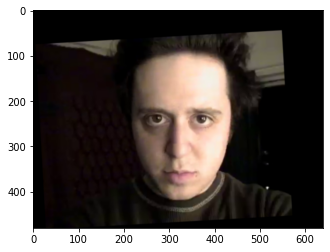

In [43]:
# Rotated and scaled image
img_translated = rotate_and_scale_img(img, angle, scale)
plt.imshow(img_translated);

Perfect! This seems to work. So let's apply this to all images.

0it [00:00, ?it/s]

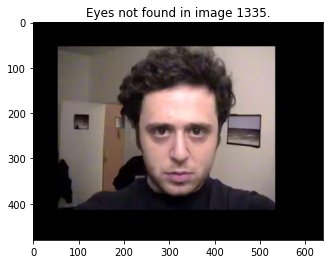

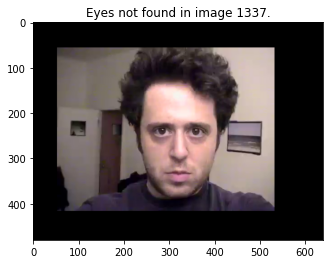

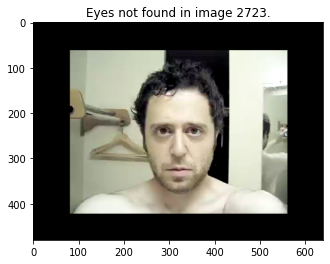

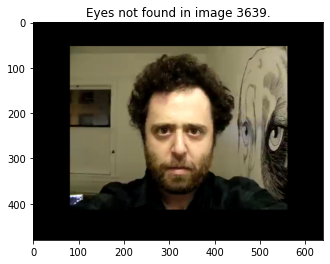

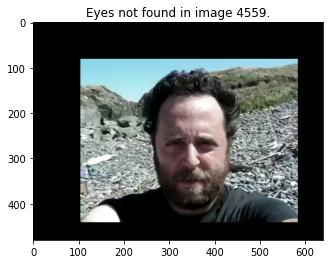

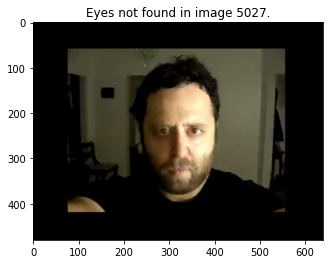

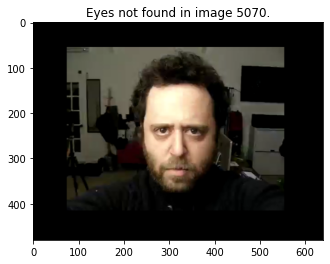

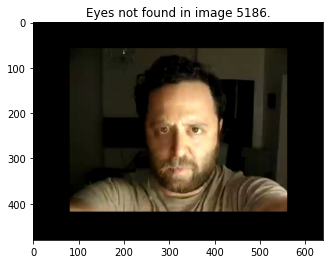

In [44]:
imgs_trans = []
for i, img in tqdm(enumerate(imgs_centered)):

    try:
        face_coord = detect_face(img)[0]
        eye_left, eye_right = extract_eye_location(face_coord, img)
        angle, scale = get_angle_and_scale(eye_left, eye_right, eye_dist=100)
        img_translated = rotate_and_scale_img(img, angle, scale)
        imgs_trans.append(img_translated)
    except:
        plt.imshow(img)
        plt.title('Eyes not found in image %d.' % i)
        plt.show()

imgs_trans = np.array(imgs_trans)

Once more, let's look at average Noah and how the images look like in quick succession.

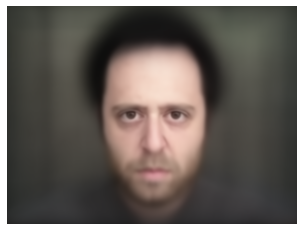

In [45]:
# Compute the mean image and plot it
noah_mean = np.mean(imgs_trans, axis=0).astype('int')
plt.imshow(noah_mean)
plt.axis('off');

Much better, the "average Noah" comes through more and more.

What we an also observe is that there's still quite some black area of the canvas around the images, due to our rotation and scaling approach. To reduce the amount of data and get the images in a more compact version, let's (1) square images and resize them to a lower resolution.

### E. Crop image and resize it

To do this step, let's write a new function.

In [46]:
def square_and_resize(img, dim=192):
    
    # Get image dimension
    height, width = img.shape[:2]
    offset = (width - height) // 2
    
    # Square image
    img_squared = img[:, offset:offset+height, :]
    
    # Resize image
    img_resized = cv2.resize(img_squared, (dim, dim))
    
    return img_resized

Let's see this function in action by applying it to the mean image from above.

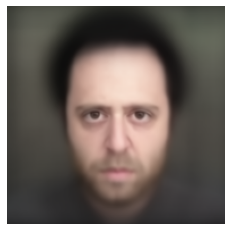

In [47]:
# Square and resize the mean image and plot it
noah_squared = square_and_resize(noah_mean.astype('uint8'), dim=192)
plt.imshow(noah_squared)
plt.axis('off');

Great, the most important parts are still there! But like this, we were able to reduce the dataset down to 12% of its original size. So let's apply this function to all images.

In [48]:
# Crop and resize all images
imgs_cropped = np.array([square_and_resize(img) for img in imgs_trans])

And now, once more, let's take a look at a gif of the first few images.

In [49]:
# Save first few images in a gif and show it
from IPython.display import Image
from imageio import mimwrite
mimwrite('noah_03.gif', imgs_cropped[:120], format='gif', fps=12)
Image(url='noah_03.gif', width=400)

**Observation**: The images seem very well aligned (given a fully automatic approach). However, there are still some images which are completely off, e.g. off center or wrongly scaled.

**Decision**: Now that all the images are allgined to the eye center, rotated to the horizontal plane and scaled to an equal distance of 100 pixels and cropped and resized - let's explore the dataset in more details.

## Step 3. Exploratory data anaylsis

### A. Explore what we have

To better underestand our dataset, let's first look at what we've got. To do so, let's take the whole dataset and devide it in 64 equal parts, where each part is an average of the images in this section.

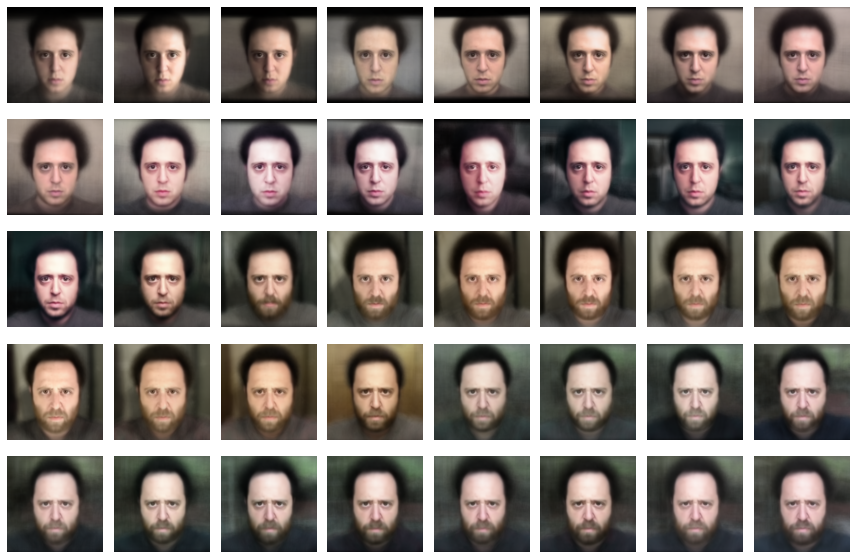

In [50]:
# Plot a grid of certain size of first x images
grid_size = (5, 8)
grid_points = np.prod(grid_size)
imgs_averages = np.array_split(imgs_cropped, grid_points)
fig, axes = plt.subplots(grid_size[0], grid_size[1], figsize=(12, 8))
for i, ax in zip(np.arange(grid_points), axes.flatten()):
    ax.imshow(imgs_averages[i].mean(0).astype('int'))
    ax.axis('off')
plt.tight_layout();

**Note**, each of this picture is the average of roughly 6 months!

What about plotting all pixels next to each other, for all images?

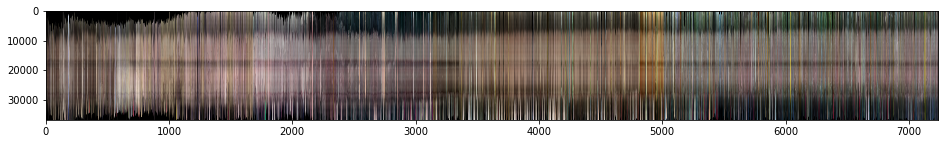

In [51]:
pixel_imgs = np.reshape(imgs_cropped, (len(imgs_cropped), -1, 3))
plt.figure(figsize=(16, 2))
plt.imshow(np.rollaxis(pixel_imgs, 1, 0).astype('int'), aspect='auto');

Out of curiosity, let's try another way to plot the dominant colors per image.

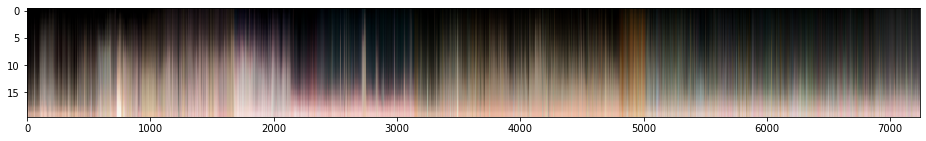

In [52]:
# Compute dominant color per image and plot it in a row
dominant_colors = np.array([np.array([
    np.percentile(img[..., i], np.linspace(10, 90, num=20)) for i in range(3)]).T for img in imgs_cropped])
plt.figure(figsize=(16, 2))
plt.imshow(np.rollaxis(dominant_colors, 1, 0).astype('int'), aspect='auto');

### B. Remove what we don't want

As previously mentioned, the numerous transformation we applied before might not have worked perfectly for all images (e.g. scaling, rotation and translation). To find the images where this didn't work, i.e. the outliers, we will apply different approaches.

**First**, let's find images which are mostly black (i.e. where the translation was very much off.

In [53]:
def is_img_black(img, threshold=0.5):
    
    # Find percentage of fully black pixels
    blacks = np.mean(np.mean(img, axis=-1)==0)
    
    return blacks > threshold

In [54]:
# Collect which images to keep
imgs2keep = np.ravel([~is_img_black(img) for img in imgs_cropped])

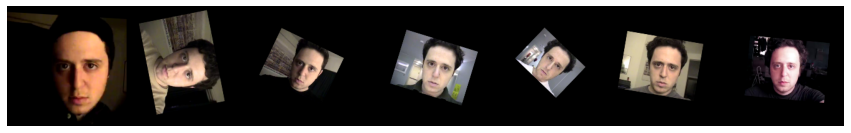

In [55]:
# Plot images that were detect to be mostly black
plt.figure(figsize=(15, 5))
plt.imshow(np.hstack(imgs_cropped[~imgs2keep]))
plt.axis('off');

It seems this detection of outliers worked, so let's remove these images.

In [56]:
imgs_cleaned = imgs_cropped[imgs2keep]
imgs_cleaned.shape

(7233, 192, 192, 3)

As a next step, let's focus in on the eyes in the center of the image and let's see if some images were falsely rotated or scaled.

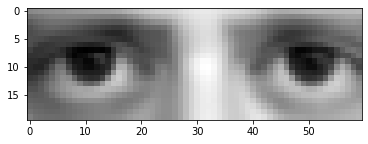

In [57]:
# Extract center region and plot overal average
center = np.divide(imgs_cleaned.shape[1:-1], 2).astype('int')
center_region = imgs_cleaned[:, center[0]-10:center[0]+10, center[1]-30:center[1]+30, :]
center_region = np.array([cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in center_region])
mean_eyes = np.mean(center_region, 0).astype('int')
plt.imshow(mean_eyes, cmap='gray');

In [58]:
# Reshape image to a flat array of pixels
data_center = np.reshape(center_region, (len(center_region), -1))

# Compute the correlation between each image and the eye regio
corrs = []
for data in tqdm(data_center):
    corr = np.corrcoef(np.ravel(mean_eyes), data)[0, 1]
    corrs.append(corr)
corrs = np.array(corrs)

  0%|          | 0/7233 [00:00<?, ?it/s]

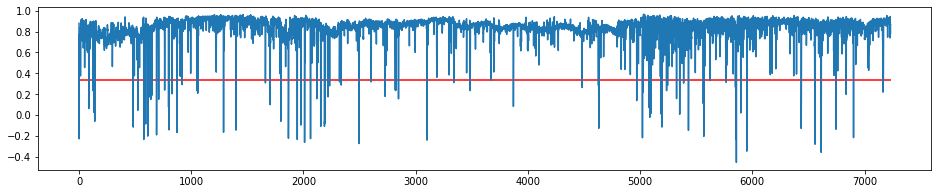

In [59]:
# Plot correlations over time
plt.figure(figsize=(16,3))
plt.plot(corrs)
plt.hlines(0.333, 0, len(corrs), color='r');

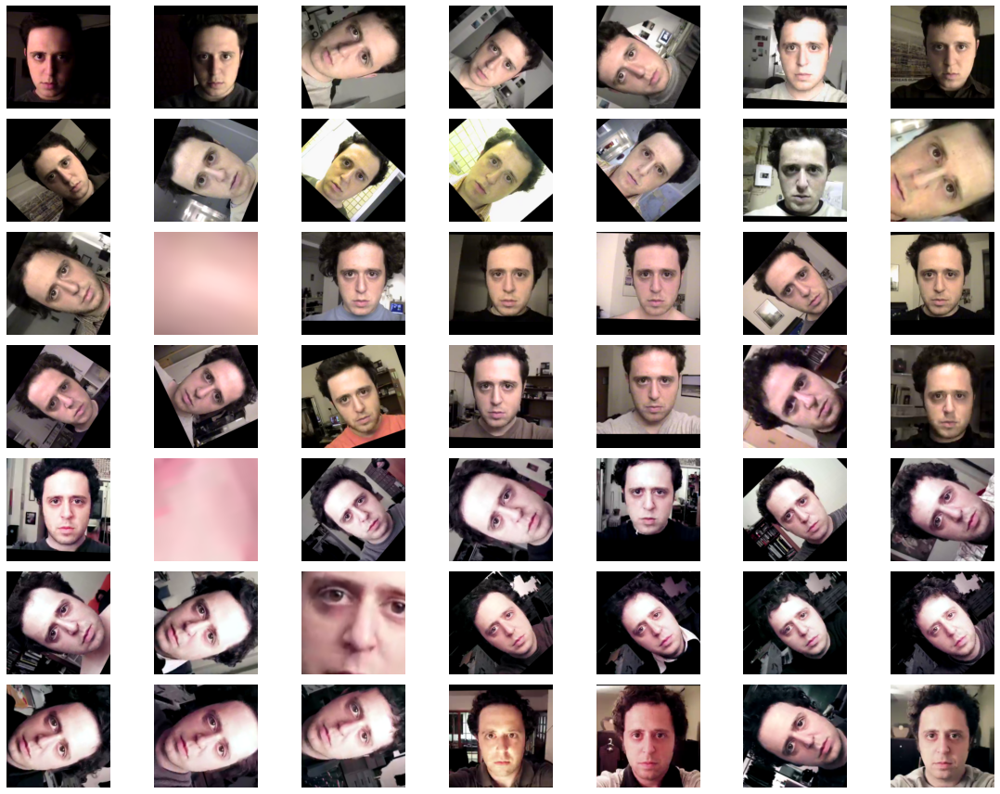

In [60]:
# Plot images that have less than 0.3333 correlation with average eye image
thresh_corr = 0.3333
size = 7
fig, axes = plt.subplots(size, size, figsize=(16, 12))
for i, ax in zip(np.arange(size**2), axes.flatten()):
    ax.imshow(imgs_cleaned[corrs<thresh_corr][i])
    ax.axis('off')
plt.tight_layout();

Also this step seems to mostly work. Let's remove these images from the dataset.

In [61]:
imgs_final = imgs_cleaned[corrs>thresh_corr]
imgs_final.shape

(7132, 192, 192, 3)

### C. Explore data from higher dimensions through 2D projects

To better understand how the images relate to each other, let's look at two ways of projecting the images from a high-dimensional space (i.e. 192 x 192 pixels = 36864 dimenions), down to two dimensions. To do so, we will use principal component analysis (PCA) and T-SNE.

In [62]:
# Transform all images to grayscale to reduce dimension by factor of 3
imgs_gray = np.array([cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in imgs_final])/255.
data = np.reshape(imgs_gray, (len(imgs_gray), -1))

In [63]:
from sklearn.decomposition import PCA
pca = PCA(250)
%time x_pca = pca.fit_transform(data)

CPU times: user 1min 35s, sys: 4.16 s, total: 1min 39s
Wall time: 27.5 s


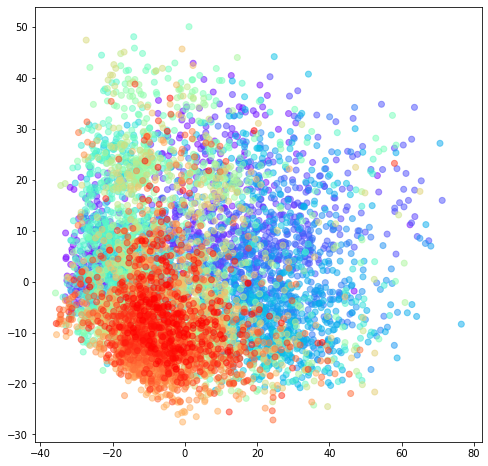

In [64]:
# Plot first two PCA components with image index color coded
plt.figure(figsize=(8, 8))
plt.scatter(x_pca[: ,0], x_pca[: ,1], c=np.arange(len(x_pca)), alpha=0.5, cmap='rainbow');

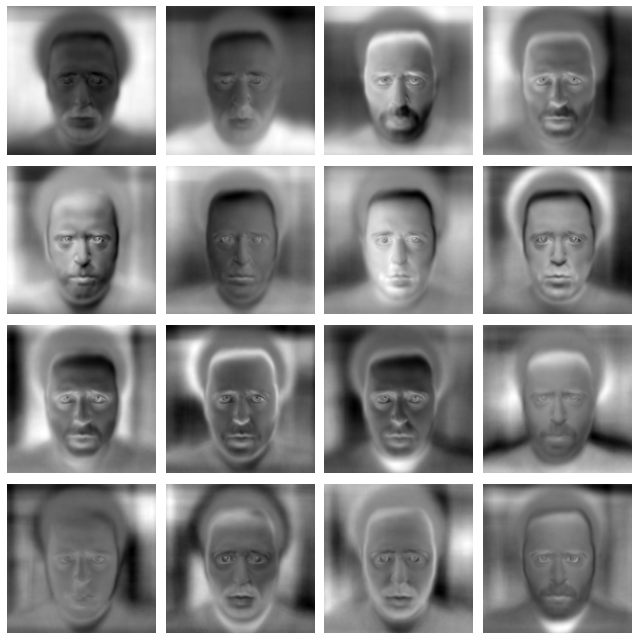

In [65]:
# Plot the first few PCA components as images
components = np.reshape(pca.components_, (pca.n_components_, *imgs_gray.shape[1:]))
fig, axes = plt.subplots(4, 4, figsize=(9, 9))
for i, ax in zip(np.arange(16), axes.flatten()):
    comp = components[i]-components[i].min()
    comp /= comp.max()
    ax.imshow(comp, cmap='gray')
    ax.axis('off')
plt.tight_layout()

In [66]:
# Compute TSNE components
from sklearn.manifold import TSNE
tsne = TSNE()
%time x_tsne = tsne.fit_transform(x_pca)

CPU times: user 3min 9s, sys: 6.68 s, total: 3min 15s
Wall time: 40.4 s


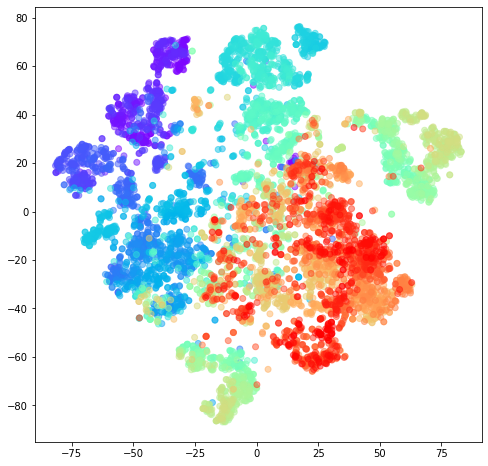

In [67]:
# Plot TSNE components with image index color coded
plt.figure(figsize=(8, 8))
plt.scatter(x_tsne[: ,0], x_tsne[: ,1], c=np.arange(len(x_tsne)), alpha=0.5, cmap='rainbow')

## Step 4. Create final output

In [68]:
n_steps = 15
smooth = 180
imgs_average = []
for i in tqdm(range(len(imgs_final)//n_steps)):
    new_average = np.mean(imgs_final[i*n_steps:i*n_steps+smooth, ...], axis=0)
    imgs_average.append(new_average)
imgs_average = np.array(imgs_average)
imgs_average.shape

  0%|          | 0/475 [00:00<?, ?it/s]

(475, 192, 192, 3)

In [69]:
# Save images in gif - every second is one year, and the average is covering 6 months
from imageio import mimwrite
mimwrite('noah_average.gif', imgs_average.astype('uint8'), format='gif', fps=24)

from IPython.display import Image
Image(url='noah_average.gif', width=400)

## Step 5. Have fun with some machine learning



### A. Data Preparation

To prepare the dataset for some machine learning, let's do the following steps:

1. Convert RGB color images to grayscale (to reduce size of images by factor of 3)
2. Downsample images from 192 x 192 pixels to something smaller like 64 x 64 (reduce size by another factor of 9)
3. Rescale values from 0 to 255 to values between -1 to 1.

(7132, 192, 192)

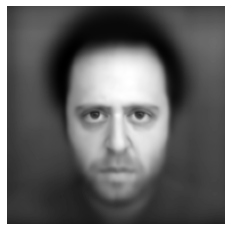

In [70]:
# Transform images to grayscale
imgs_gray = np.array([cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in imgs_final])
plt.imshow(np.mean(imgs_gray, axis=0), cmap='gray');
plt.axis('off');
imgs_gray.shape

(7132, 64, 64)

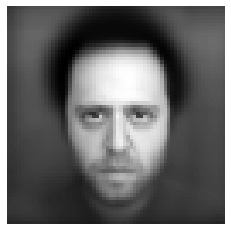

In [71]:
# Downsample image to lower image resolution
p_size = 64
imgs_lower = np.array([cv2.resize(img, (p_size, p_size)) for img in imgs_gray])
plt.imshow(np.mean(imgs_lower, axis=0), cmap='gray');
plt.axis('off');
imgs_lower.shape

In [72]:
# Normalize images and flatten array
x_train = (imgs_lower-127.5)/127.5
x_train = np.reshape(x_train, (len(x_train), -1))
x_train.shape

(7132, 4096)

In [73]:
# Create N target classes - i.e. divide 20 years into N equal chunks
n_chunks = 8
n_elements = int(np.ceil(len(x_train)/n_chunks))
labels = np.ravel([np.full(n_elements, i) for i in range(n_chunks)])
y_train = labels[:len(x_train)] - (n_chunks-1)/2

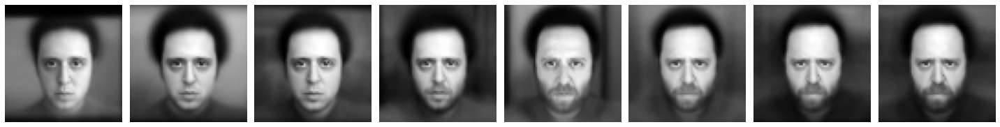

In [74]:
# Plot the selected images next to each other
fig, axes = plt.subplots(1, n_chunks, sharey=True, figsize=(2.5 * n_chunks, 3))
for i, j in enumerate(np.unique(y_train)):
    img = np.reshape(x_train[y_train==j], (-1, p_size, p_size))
    axes[i].imshow(np.mean(img, axis=0), cmap='gray')
    axes[i].axis('off')
plt.tight_layout()

### B. Predicting Age with Logistic Regression

In [75]:
# Let's keep our notebook clean, so it's a little more readable!
import warnings
warnings.filterwarnings('ignore')

In [76]:
# Setup Lasso model
from sklearn.linear_model import LassoCV
lasso = LassoCV(alphas=np.logspace(-4.5, -3, num=16),
                cv=5,
                tol=1e-4,
                max_iter=250,
                n_jobs=-1,
                verbose=1)

In [77]:
# Train model and find most optimal hyper-parameter
lasso.fit(x_train, y_train);

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
.............................................................................[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:  1.5min remaining:  2.2min
...[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  1.5min finished


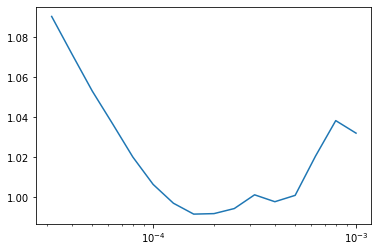

In [78]:
# Plot relationship between hyper-parameter and model performance
import pandas as pd
df = pd.DataFrame(lasso.mse_path_, index=lasso.alphas_)
df.mean(axis=1).plot(logx=True);

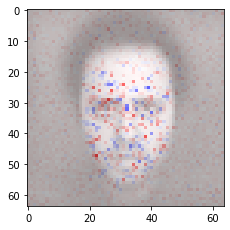

In [79]:
# Overlay model coefficients and average face to see region of importance
img_mean = np.mean(np.reshape(x_train, (-1, p_size, p_size)), axis=0)
fig = plt.figure(figsize=(12, 12))
ax1 = fig.add_subplot(1, 3, 1)
ax1.imshow(img_mean, cmap='gray')
ax1.imshow(np.reshape(lasso.coef_, (p_size, p_size)), alpha=0.6, cmap='bwr');

### C. Check how old you are in "Noah years"

In [80]:
from urllib.request import urlopen
from PIL import Image

# Load an image from the internet
url = 'https://avatars1.githubusercontent.com/u/950321'
img_me = np.array(Image.open(urlopen(url)))

In [81]:
# Correct image for contrast intensity
plow, phigh = np.percentile(img_me, (0, 99))
img_me = rescale_intensity(img_me, in_range=(plow, phigh))

In [82]:
# Recenter image
img_me = recenter_image(img_me)

In [83]:
# Translate, rotate and scale image
face_coord = detect_face(img_me)[0]
eye_left, eye_right = extract_eye_location(face_coord, img_me)
angle, scale = get_angle_and_scale(eye_left, eye_right, eye_dist=100)
img_translated = rotate_and_scale_img(img_me, angle, scale)

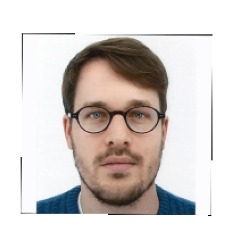

In [84]:
# Square image canvas
me_squared = square_and_resize(img_translated.astype('uint8'), dim=192)
me_squared[me_squared==0]=255
plt.imshow(me_squared)
plt.axis('off');

In [85]:
from IPython.display import Image
from imageio import mimwrite

# Gif switching between average Noah and me
noah_mean = np.mean(imgs_final, axis=0).astype('uint8')
mimwrite('noah_and_me.gif', [noah_mean, me_squared], format='gif', fps=4)
Image(url='noah_and_me.gif', width=200)

In [86]:
# Prepare image (i.e. transform to grayscale, downsample and normalize)
me_me_me = cv2.cvtColor(me_squared, cv2.COLOR_BGR2GRAY)
me_me_me = cv2.resize(me_me_me, (p_size, p_size))
me_me_me = (me_me_me-127.5)/127.5

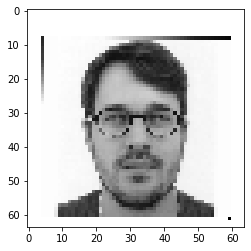

In [87]:
# Show me
plt.imshow(me_me_me, cmap='gray')

In [88]:
# Predict my Noah-age
my_age = lasso.predict(np.reshape(me_me_me, (1, -1)))[0]
my_age

-1.1999171976867975

In [89]:
# Find age category
age_idx = np.argmin(np.abs(np.unique(y_train)-my_age))
age_idx

2

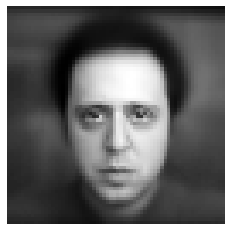

In [90]:
# Plot closest age group
age_group = np.unique(y_train)[age_idx]
noah_age = np.reshape(x_train[y_train==age_group], (-1, p_size, p_size))
plt.imshow(np.mean(noah_age, axis=0), cmap='gray')
plt.axis('off');

### D. Genereating content / understand structure with GANs

Let's see what we can do with a simple generative adversarial network (GAN), and hopefully answer the life long question of "which Noah are you?".

First things first, let's setup this GAN, or more precicely, a Deep Convolutional Generative Adversarial Network (DCGAN).

In [91]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
tf.__version__

'2.4.1'

In [92]:
# Preparation of dataset
x_gan = np.reshape(x_train, (len(x_train), p_size, p_size, 1))
y_gan = np.arange(len(x_gan))
np.random.shuffle(y_gan)
x_gan = x_gan[y_gan]
x_gan = (x_gan + 1)/2
x_gan.shape

(7132, 64, 64, 1)

In [93]:
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

In [94]:
## Build the encoder
latent_dim = 2

encoder_inputs = keras.Input(shape=(64, 64, 1))
x = layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2D(128, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(256, activation="relu")(x)
x = layers.Dense(32, activation="relu")(x)
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])
encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 64, 64, 1)]  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 32, 32, 32)   320         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 16, 16, 64)   18496       conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 8, 8, 128)    73856       conv2d_1[0][0]                   
____________________________________________________________________________________________

In [95]:
## Build the decoder
latent_inputs = keras.Input(shape=(latent_dim,))
x = layers.Dense(32, activation="relu")(latent_inputs)
x = layers.Dense(256, activation="relu")(x)
x = layers.Dense(8192, activation="relu")(x)
x = layers.Reshape((8, 8, 128))(x)
x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(1, 3, activation="relu", strides=2, padding="same")(x)
decoder_outputs = layers.Conv2DTranspose(1, 3, activation="sigmoid", padding="same")(x)
decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

Model: "decoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 2)]               0         
_________________________________________________________________
dense_2 (Dense)              (None, 32)                96        
_________________________________________________________________
dense_3 (Dense)              (None, 256)               8448      
_________________________________________________________________
dense_4 (Dense)              (None, 8192)              2105344   
_________________________________________________________________
reshape (Reshape)            (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 16, 16, 64)        73792     
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 32, 32, 32)        1846

In [96]:
## Define the VAE as a `Model` with a custom `train_step`
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder

    def train_step(self, data):
        if isinstance(data, tuple):
            data = data[0]
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = encoder(data)
            reconstruction = decoder(z)
            reconstruction_loss = tf.reduce_mean(
                keras.losses.binary_crossentropy(data, reconstruction)
            )
            reconstruction_loss *= 64 * 64
            kl_loss = 1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)
            kl_loss = tf.reduce_mean(kl_loss)
            kl_loss *= -0.5
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        return {
            "loss": total_loss,
            "reconstruction_loss": reconstruction_loss,
            "kl_loss": kl_loss,
        }

In [97]:
# Train VAE
vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
vae.fit(x_gan, epochs=50, batch_size=128)

Epoch 1/50
56/56 [==============================] - 13s 205ms/step - loss: 2795.3140 - reconstruction_loss: 2795.1431 - kl_loss: 0.1708
Epoch 2/50
56/56 [==============================] - 11s 199ms/step - loss: 2680.8587 - reconstruction_loss: 2679.1266 - kl_loss: 1.7321
Epoch 3/50
56/56 [==============================] - 11s 191ms/step - loss: 2551.3915 - reconstruction_loss: 2548.1519 - kl_loss: 3.2396
Epoch 4/50
56/56 [==============================] - 11s 195ms/step - loss: 2313.9042 - reconstruction_loss: 2310.3662 - kl_loss: 3.5379
Epoch 5/50
56/56 [==============================] - 11s 203ms/step - loss: 2267.8907 - reconstruction_loss: 2264.7049 - kl_loss: 3.1859
Epoch 6/50
56/56 [==============================] - 11s 192ms/step - loss: 2248.4341 - reconstruction_loss: 2245.1100 - kl_loss: 3.3241
Epoch 7/50
56/56 [==============================] - 12s 209ms/step - loss: 2233.2733 - reconstruction_loss: 2229.8392 - kl_loss: 3.4341
Epoch 8/50
56/56 [==============================

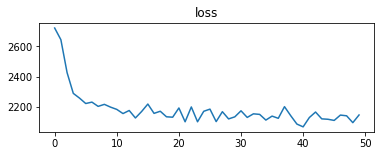

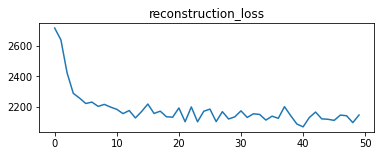

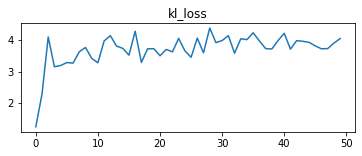

In [98]:
# Plot model evolution
history = vae.history.history.copy()
for k in history:
    plt.figure(figsize=(6, 2))
    plt.title(k)
    plt.plot(history[k])
    plt.show()

In [99]:
## Display a grid of sampled digits
import matplotlib.pyplot as plt

def plot_latent(encoder, decoder):
    # display a n*n 2D manifold of digits
    n = 16
    digit_size = 64
    scale = 2.
    figsize = 16
    figure = np.zeros((digit_size * n, digit_size * n))
    # linearly spaced coordinates corresponding to the 2D plot
    # of digit classes in the latent space
    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[xi, yi]])
            x_decoded = decoder.predict(z_sample)
            digit = x_decoded[0].reshape(digit_size, digit_size)
            figure[
                i * digit_size : (i + 1) * digit_size,
                j * digit_size : (j + 1) * digit_size,
            ] = digit

    plt.figure(figsize=(figsize, figsize))
    start_range = digit_size // 2
    end_range = n * digit_size + start_range + 1
    pixel_range = np.arange(start_range, end_range, digit_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.imshow(figure, cmap="Greys_r")
    plt.axis('off')
    plt.show()

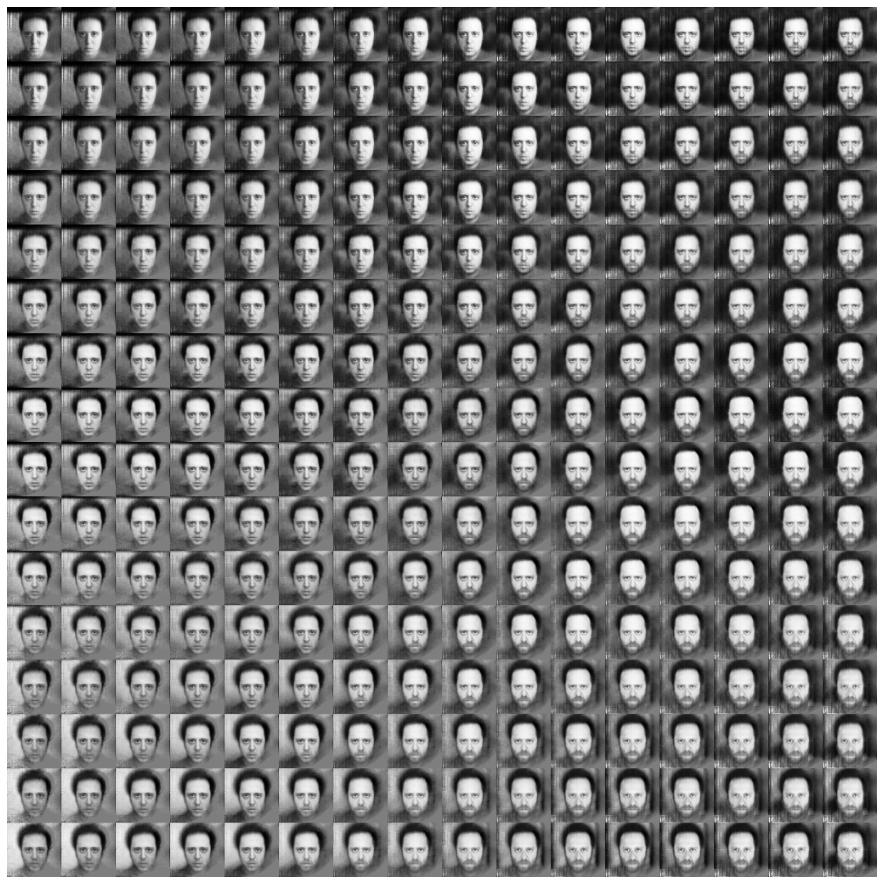

In [100]:
plot_latent(encoder, decoder)

In [101]:
## Display how the latent space clusters different digit classes
def plot_label_clusters(encoder, decoder, data, labels):
    # display a 2D plot of the digit classes in the latent space
    z_mean, _, _ = encoder.predict(data)
    plt.figure(figsize=(12, 10))
    plt.scatter(z_mean[:, 0], z_mean[:, 1], c=labels, cmap='rainbow')
    plt.colorbar()
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.show()

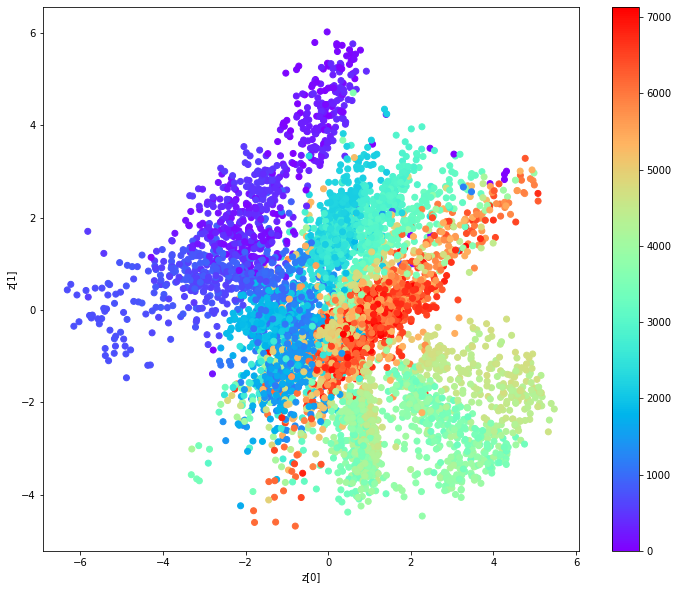

In [102]:
plot_label_clusters(encoder, decoder, x_gan, y_gan)

### E. Which Noah are you?

Which Noah will I become if I send my picture through the GAN?

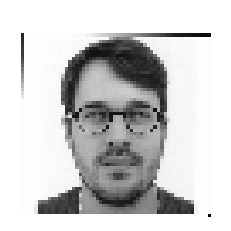

In [103]:
plt.imshow(me_me_me, cmap='gray')
plt.axis('off');

In [104]:
# Encode me in Noah's latent space
latent_me = encoder.predict(me_me_me[None, ..., None])

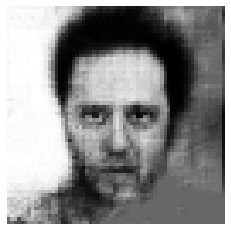

In [105]:
# Generate Noah-me
plt.imshow(decoder.predict(latent_me[0])[0], cmap='gray')
plt.axis('off');